In [40]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import scipy.cluster.hierarchy as shc

In [6]:
df = pd.read_csv("dataset.csv")
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [7]:
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [8]:
df = df.dropna()
len(df)

113999

In [10]:
newdf = df.drop(["Unnamed: 0","track_id","album_name","track_name","artists"],axis=1)

In [11]:
newdf

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,21,384999,False,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,22,385000,False,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,22,271466,False,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,41,283893,False,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


In [12]:
label_encoder = LabelEncoder()
newdf["track_genre"] = label_encoder.fit_transform(newdf["track_genre"])

In [13]:
newdf.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


In [16]:
scaler = MinMaxScaler()
print(scaler.fit(newdf))
print(scaler.data_max_)
scaled_data = scaler.transform(newdf)
scaled_data.shape

MinMaxScaler()
[1.000000e+02 5.237295e+06 1.000000e+00 9.850000e-01 1.000000e+00
 1.100000e+01 4.532000e+00 1.000000e+00 9.650000e-01 9.960000e-01
 1.000000e+00 1.000000e+00 9.950000e-01 2.433720e+02 5.000000e+00
 1.130000e+02]


(113999, 16)

# Clustering

In [30]:
wcss = []
no = []
for i in range(1,31):
    km = KMeans(n_clusters=i)
    km.fit_predict(scaled_data)
    wcss.append(km.inertia_)
    no.append(i)

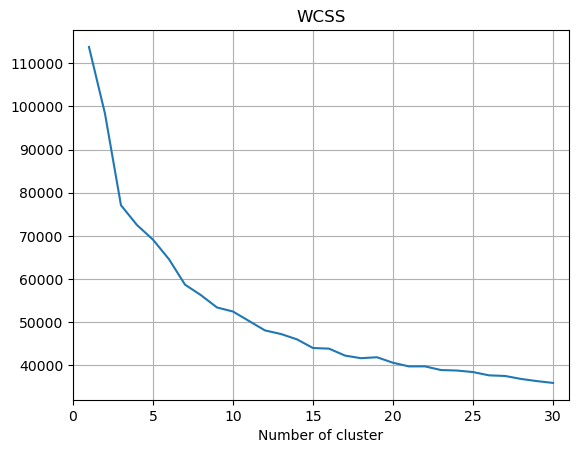

In [35]:
plt.grid()
plt.title("WCSS")
plt.xlim([0,31])
plt.plot(no,wcss)
plt.xlabel("Number of cluster")
plt.show()

## agglomerative clustering

In [50]:
data = pd.DataFrame(data=scaled_data)
data1 = data.sample(n=10000)

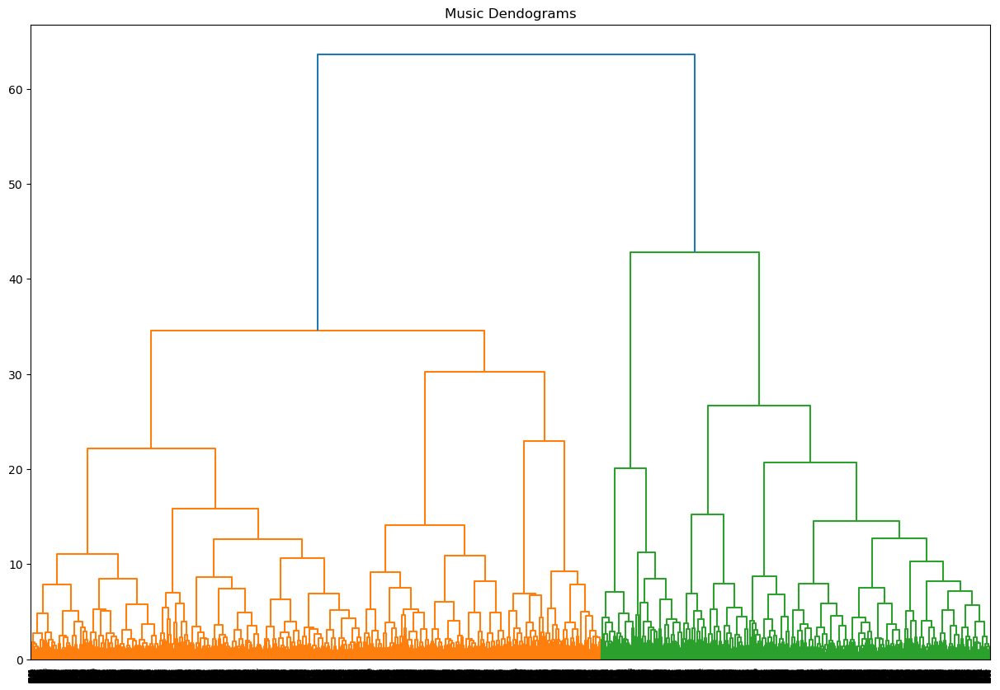

In [51]:
plt.figure(figsize=(15,10))
plt.title("Music Dendograms")
dend = shc.dendrogram(shc.linkage(data1,method="ward"))

In [52]:
km1 = KMeans(n_clusters=12)
label = km1.fit_predict(scaled_data)

# TSNE

In [58]:
tsne = TSNE(n_jobs=-1,max_iter=500,verbose=3)
tsne

TSNE(max_iter=500, n_jobs=-1, verbose=3)

In [59]:
X_tsne = tsne.fit_transform(scaled_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 113999 samples in 0.013s...
[t-SNE] Computed neighbors for 113999 samples in 21.215s...
[t-SNE] Computed conditional probabilities for sample 1000 / 113999
[t-SNE] Computed conditional probabilities for sample 2000 / 113999
[t-SNE] Computed conditional probabilities for sample 3000 / 113999
[t-SNE] Computed conditional probabilities for sample 4000 / 113999
[t-SNE] Computed conditional probabilities for sample 5000 / 113999
[t-SNE] Computed conditional probabilities for sample 6000 / 113999
[t-SNE] Computed conditional probabilities for sample 7000 / 113999
[t-SNE] Computed conditional probabilities for sample 8000 / 113999
[t-SNE] Computed conditional probabilities for sample 9000 / 113999
[t-SNE] Computed conditional probabilities for sample 10000 / 113999
[t-SNE] Computed conditional probabilities for sample 11000 / 113999
[t-SNE] Computed conditional probabilities for sample 12000 / 113999
[t-SNE] Computed conditional probab

In [60]:
tsne.kl_divergence_

3.3289904594421387

In [103]:
centroids = km1.cluster_centers_
# print(centroids)
centroids.shape

(12, 16)

In [91]:
cmap = ["#ff0000","#ff5300","#ffa500","#dec102","#ffff00","#80c000","#008000","#004080","#0000ff","#2600c1","#4b0082","#0d0100"]

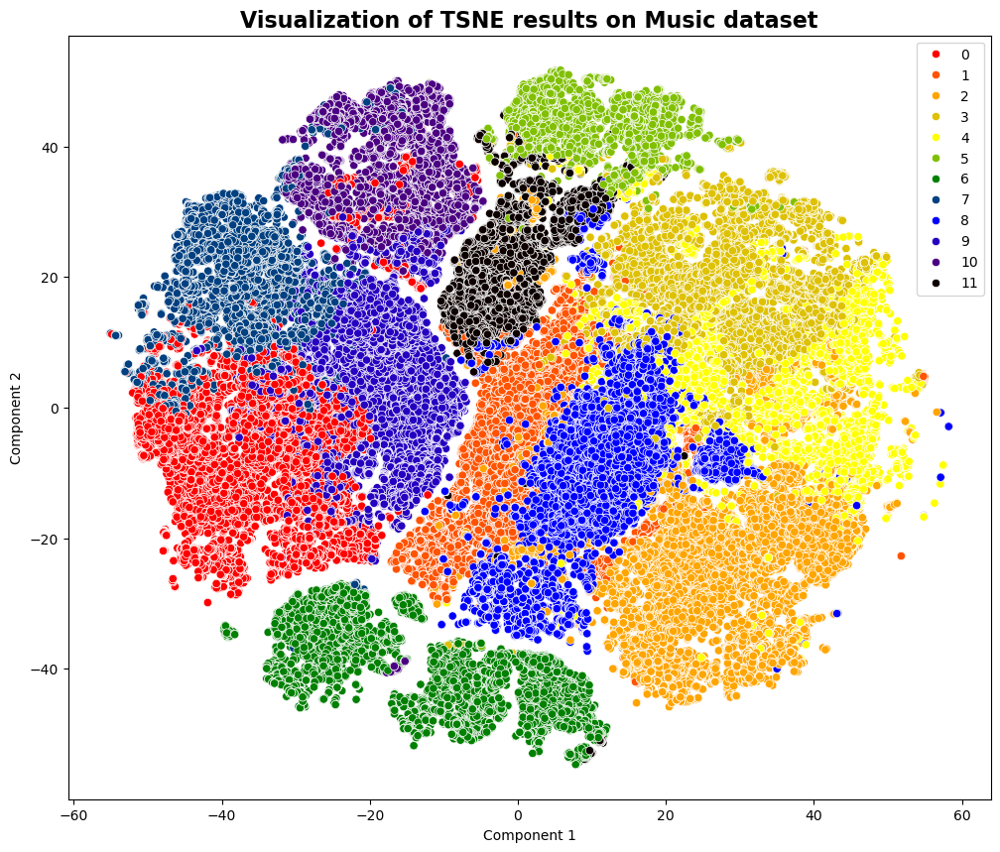

In [92]:
plt.figure(figsize=(12,10))
plt.title("Visualization of TSNE results on Music dataset", fontsize=16, weight='bold')
sns.scatterplot(x=X_tsne[:,0],y=X_tsne[:,1],hue=label,palette=cmap)
plt.xlabel("Component 1", fontsize=10)
plt.ylabel("Component 2", fontsize=10)
plt.legend(fontsize=10,loc='upper right')
plt.show()

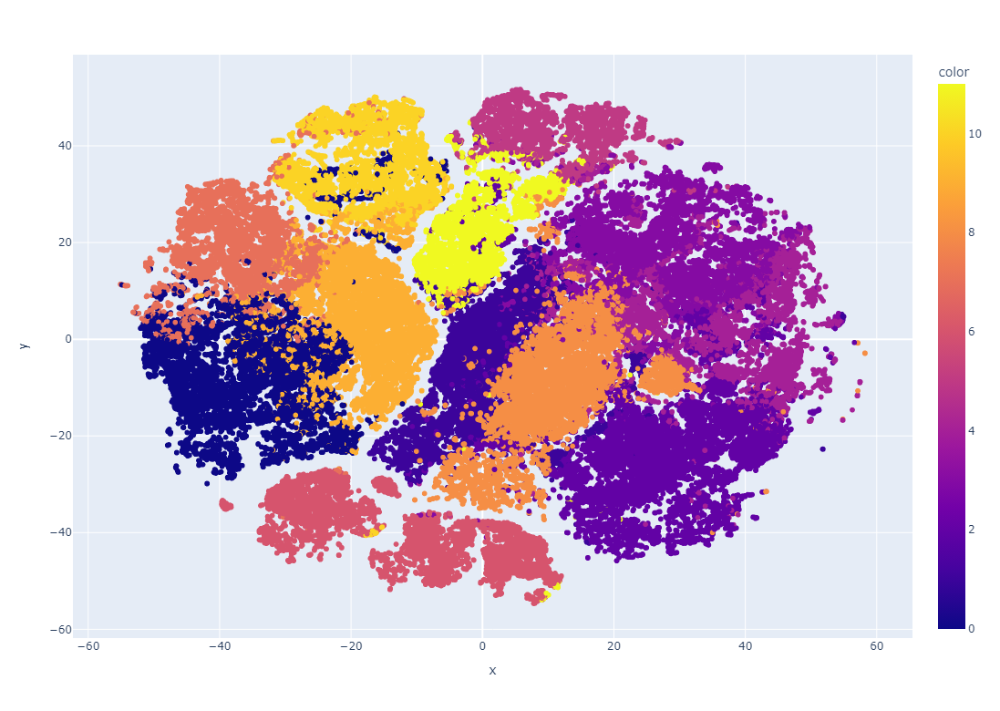

<Figure size 1200x1500 with 0 Axes>

In [100]:
plt.figure(figsize=(12,15))
fig = px.scatter(x=X_tsne[:,0], y=X_tsne[:,1],color=label,height=780)
fig.show()

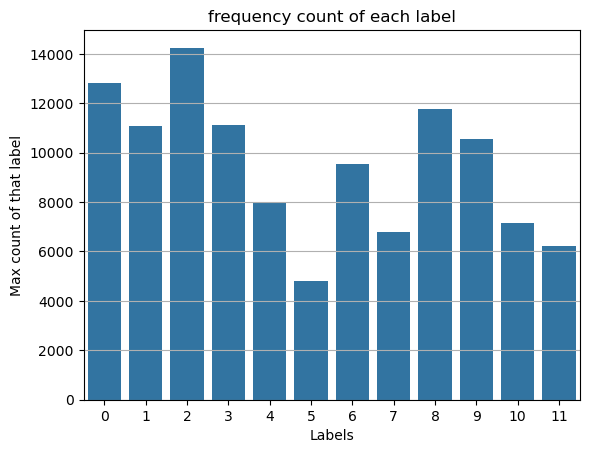

In [82]:
plt.grid()
plt.title("frequency count of each label")
sns.countplot(x=label)
plt.xlabel("Labels")
plt.ylabel("Max count of that label")
plt.show()

## create the dataset with label

In [107]:
df["labels"] = label
df.to_csv("labeled_dataset.csv")

## correlation of dataset with heatmap

In [108]:
newdf["labels"] = label

In [115]:
cluster1 = newdf[newdf["labels"]==1]

In [119]:
corr = newdf.corr()

<Axes: >

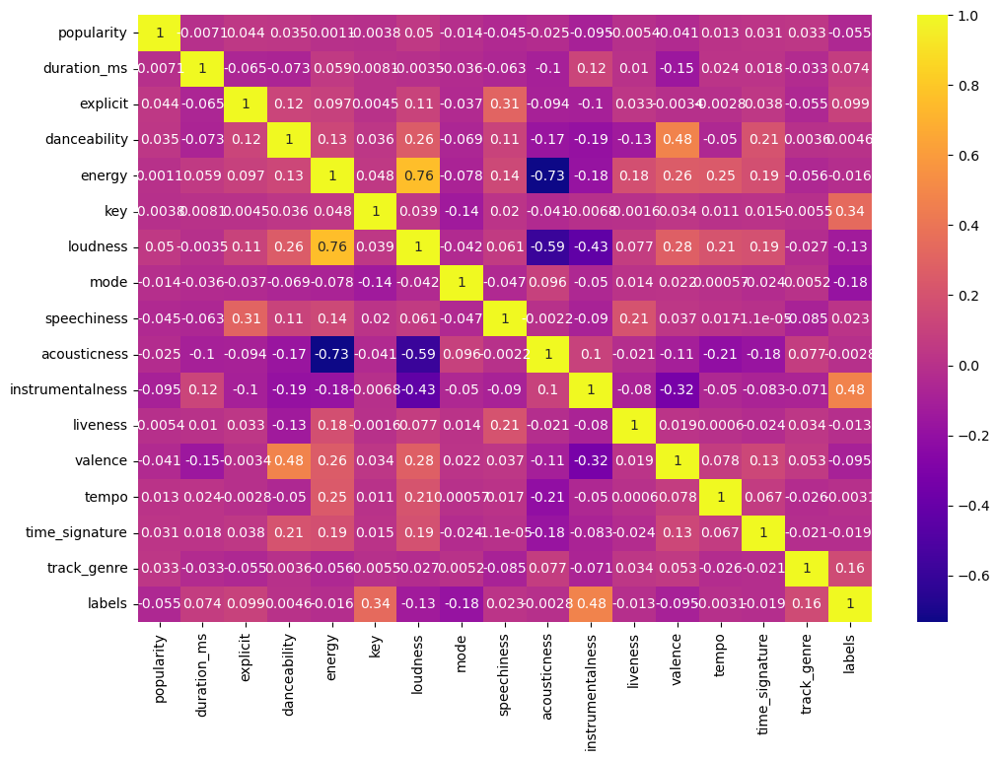

In [121]:
plt.figure(figsize=(12,8))
sns.heatmap(corr,cmap="plasma",annot=True)